# Tugas Akhir Pengolahan Citra Digital
Ilham Fazri (18/430191/PA/18704)

## Deteksi Rambu Lalu Lintas Dengan Ekstraksi Ciri HOG dan Klasifikasi SVM

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from math import sqrt,degrees,isnan
import warnings
warnings.filterwarnings('ignore')

## Mengakses File Directory Data Train

In [ ]:
regulatory_dir=os.listdir("/content/drive/MyDrive/dataset_traffic/Regulatory Signs")
mondatory_dir=os.listdir("/content/drive/MyDrive/dataset_traffic/Mondatory Signs")
warning_dir=os.listdir("/content/drive/MyDrive/dataset_traffic/Warning Signs")
non_dir=os.listdir("/content/drive/MyDrive/dataset_traffic/Non Signs")

## Menampilkan Data Train dan Normalisasi Citra

### Mondatory Signs

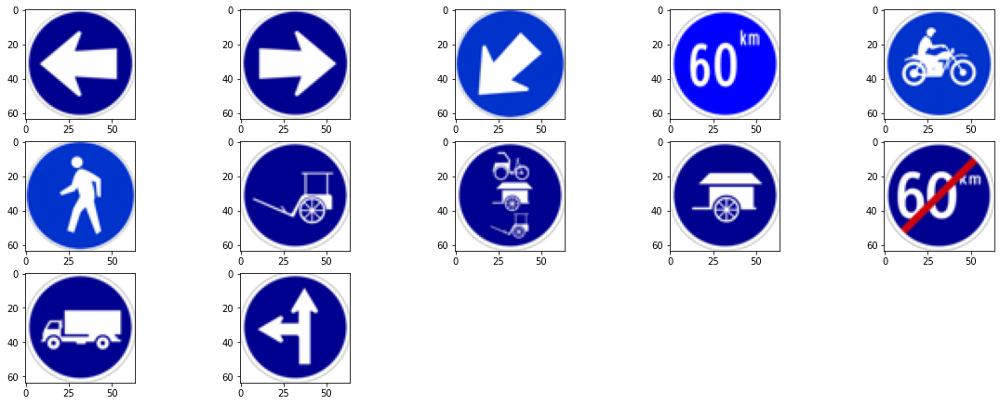

In [ ]:
i=1
img_mondatory=[]
plt.figure(figsize=(20, 10))

for dir in mondatory_dir:
  
  image = Image.open("/content/drive/MyDrive/dataset_traffic/Mondatory Signs/"+dir,'r')
  image=image.resize((64, 64))
  img_mondatory.append(np.array(image))
  i+=1
  
img_mondatory=np.array(img_mondatory)

for i in range(12):
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(img_mondatory[i])

### Regulatory Signs

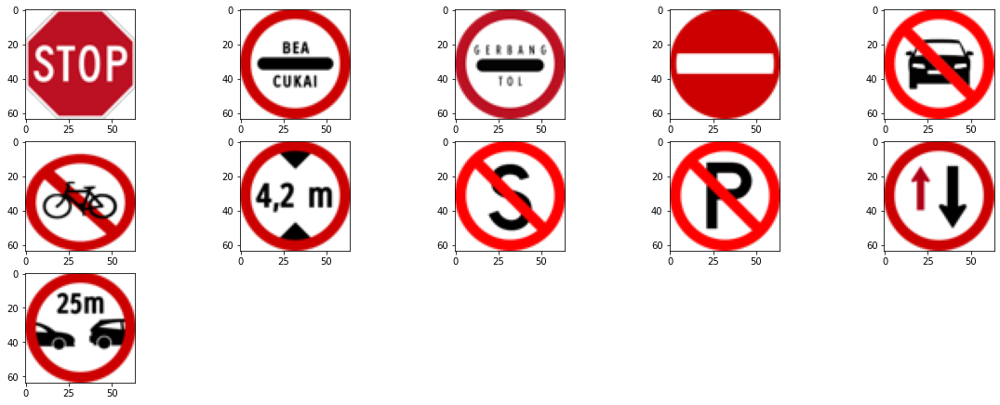

In [ ]:
i=1
img_regulatory=[]
plt.figure(figsize=(20, 10))

for dir in regulatory_dir:
  
  image = Image.open("/content/drive/MyDrive/dataset_traffic/Regulatory Signs/"+dir,'r')
  image=image.resize((64, 64))
  img_regulatory.append(np.array(image))
  i+=1
img_regulatory=np.array(img_regulatory)
for i in range(11):
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(img_regulatory[i])

### Warning Signs

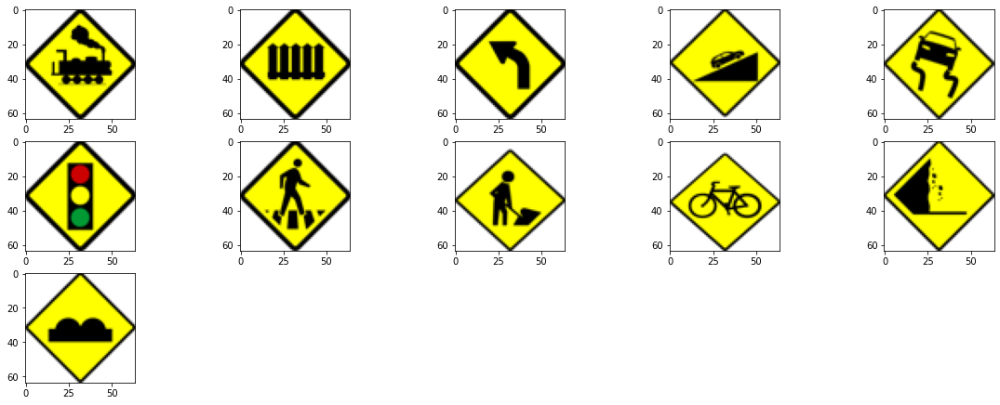

In [ ]:
i=1
img_warning=[]
plt.figure(figsize=(20, 10))
#7-13
for dir in warning_dir:
  image = Image.open("/content/drive/MyDrive/dataset_traffic/Warning Signs/"+dir,'r')
  image=image.resize((64, 64))
  img_warning.append(np.array(image))
  i+=1
img_warning=np.array(img_warning)
for i in range(11):
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(img_warning[i])


### Non Signs

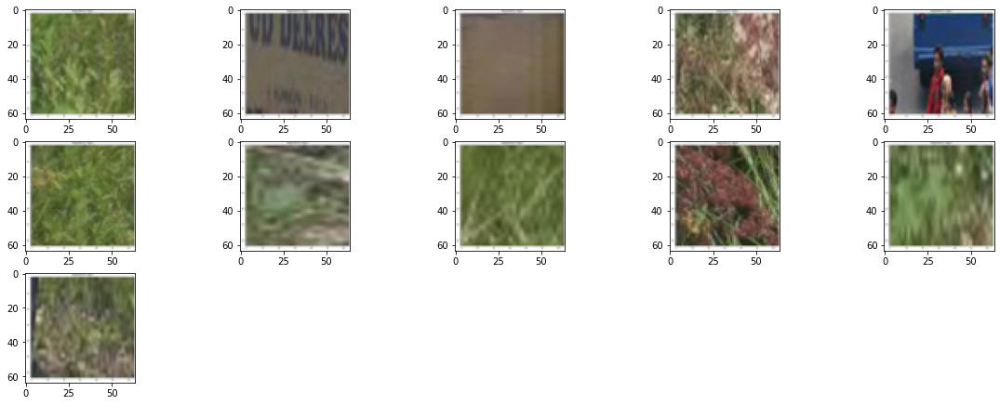

In [ ]:
i=1
img_non=[]
plt.figure(figsize=(20, 10))
#7-13
for dir in non_dir:
  image = Image.open("/content/drive/MyDrive/dataset_traffic/Non Signs/"+dir,'r')
  image=image.resize((64, 64))
  img_non.append(np.array(image))
  i+=1
img_non=np.array(img_non)
for i in range(11):
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(img_non[i])


## Konversi RGB ke Grayscale

In [ ]:
def rgb_grayscale(img_rgb):
  row,column,_= img_rgb.shape
  img_gray=np.zeros((row,column))
  r, g, b = img_rgb[:,:,0], img_rgb[:,:,1], img_rgb[:,:,2]
  img_gray=0.2989 * r + 0.5870 * g + 0.1140 *b
  return img_gray

### Mondatory Signs

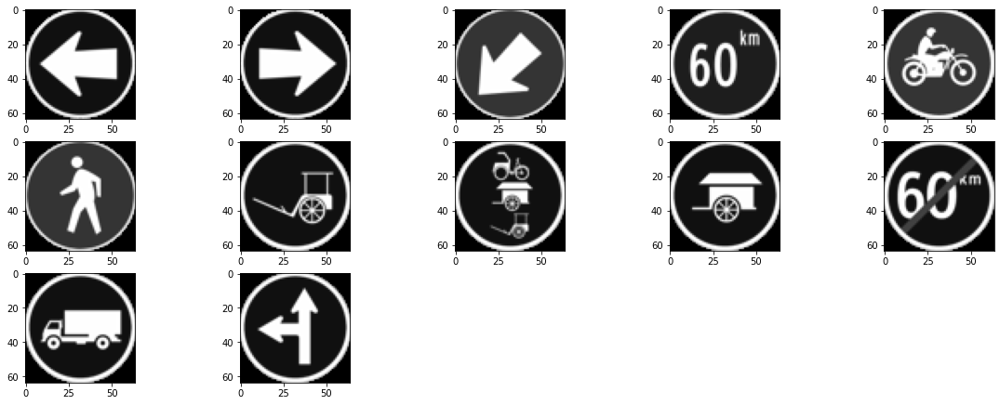

In [ ]:
n,_,_,_=img_mondatory.shape
img_mondatory_gray=[]
for i in range (0,n):
  img_mondatory_gray.append(rgb_grayscale(img_mondatory[i]))

plt.figure(figsize=(20, 10))
img_mondatory_gray=np.array(img_mondatory_gray)
for i in range(12):
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(img_mondatory_gray[i],cmap="gray")

### Regulatory Signs

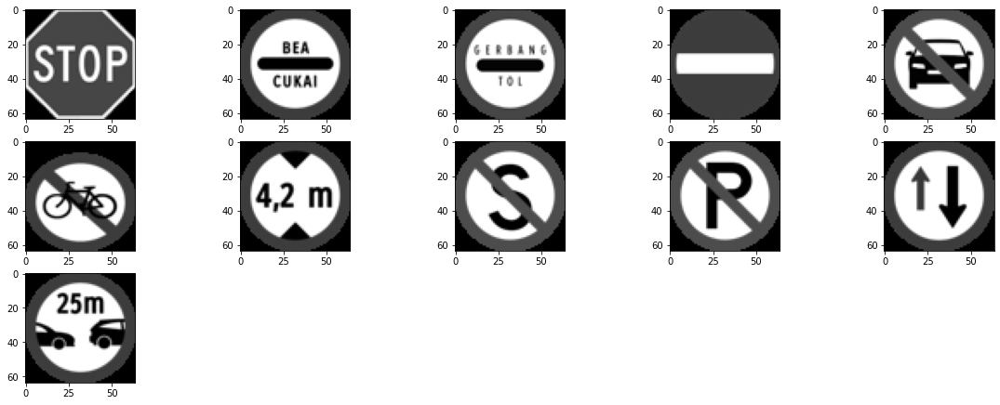

In [ ]:
n,_,_,_=img_regulatory.shape
img_regulatory_gray=[]
for i in range (0,n):
  img_regulatory_gray.append(rgb_grayscale(img_regulatory[i]))

plt.figure(figsize=(20, 10))
img_regulatory_gray=np.array(img_regulatory_gray)
for i in range(11):
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(img_regulatory_gray[i],cmap="gray")

### Warning Signs

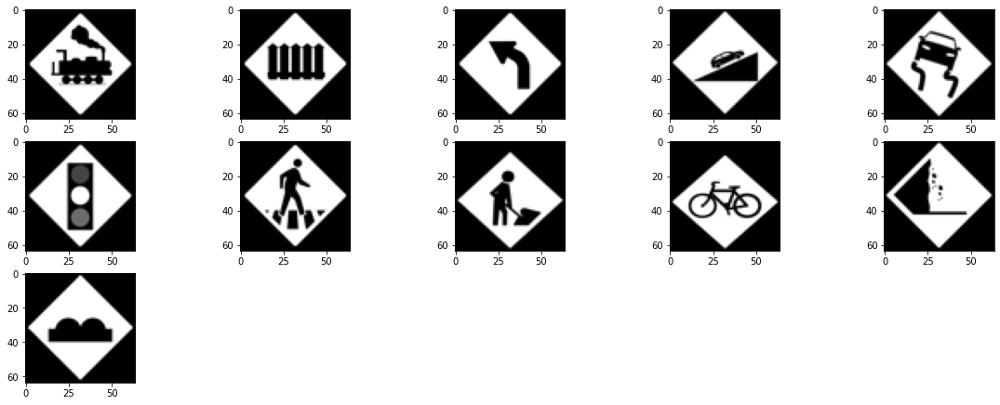

In [ ]:
n,_,_,_=img_warning.shape
img_warning_gray=[]
for i in range (0,n):
  img_warning_gray.append(rgb_grayscale(img_warning[i]))

plt.figure(figsize=(20, 10))
img_warning_gray=np.array(img_warning_gray)
for i in range(11):
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(img_warning_gray[i],cmap="gray")

### Non Signs

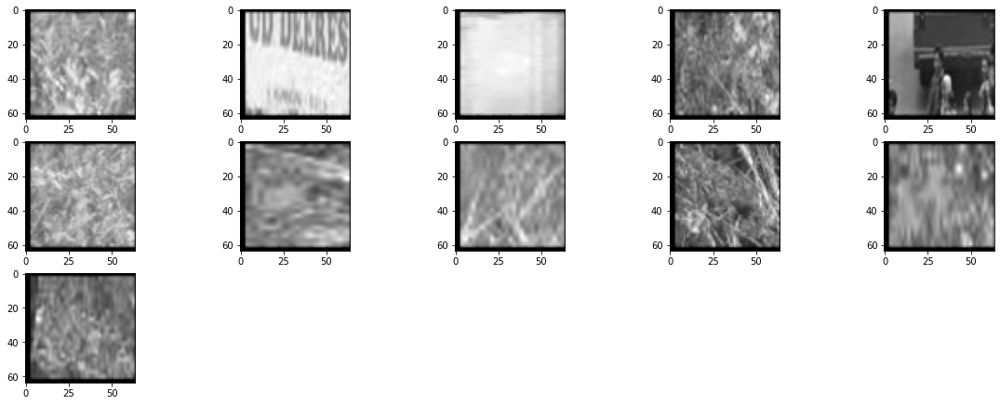

In [ ]:
n,_,_,_=img_non.shape
img_non_gray=[]
for i in range (0,n):
  img_non_gray.append(rgb_grayscale(img_non[i]))

plt.figure(figsize=(20, 10))
img_non_gray=np.array(img_non_gray)
for i in range(11):
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(img_non_gray[i],cmap="gray")

s

### Kalkulasi Gradient Images

In [ ]:
def img2gradient(img_data):
  row,column = img_data.shape
  img_mag = np.zeros((row,column))
  img_direction = np.zeros((row,column))
  for i in range(1,row-1):
    for j in range(1,column-1):
      img_mag[i][j]=sqrt((img_data[i][j+1]-img_data[i][j-1])**2+(img_data[i+1][j]-img_data[i-1][j])**2)
      direction=degrees(np.arctan((img_data[i+1][j]-img_data[i-1][j])/(img_data[i][j+1]-img_data[i][j-1])))
      if(isnan(direction)==False):
        img_direction[i][j]=degrees(np.arctan((img_data[i+1][j]-img_data[i-1][j])/(img_data[i][j+1]-img_data[i][j-1])))
  return img_mag,img_direction

#### Mondatory Signs

In [ ]:
n,_,_=img_mondatory_gray.shape
img_mondatory_mag=[]
img_mondatory_direction=[]

for i in range (0,n):
  mag,gradient = img2gradient(img_mondatory_gray[i])
  img_mondatory_mag.append(mag)
  img_mondatory_direction.append(gradient)


img_mondatory_mag=np.array(img_mondatory_mag)
img_mondatory_direction=np.array(img_mondatory_direction)

##### Magnitude Gradient

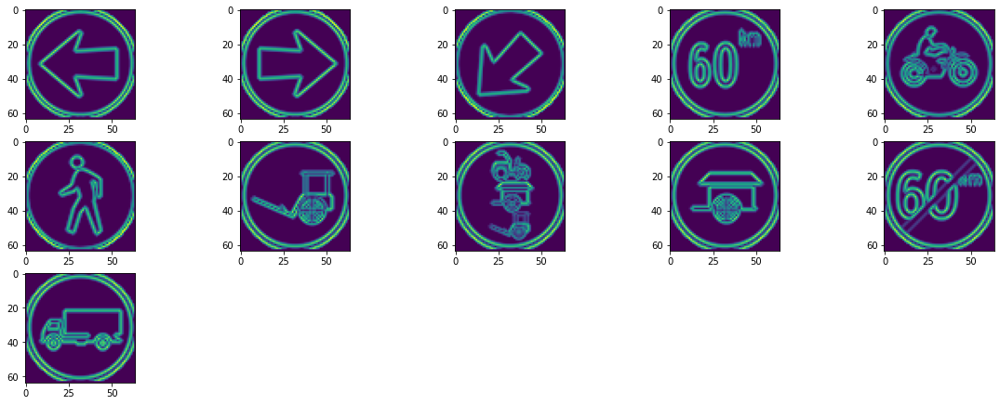

In [ ]:
plt.figure(figsize=(20, 10))
for i in range(11):
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(img_mondatory_mag[i])

##### Direction Gradient

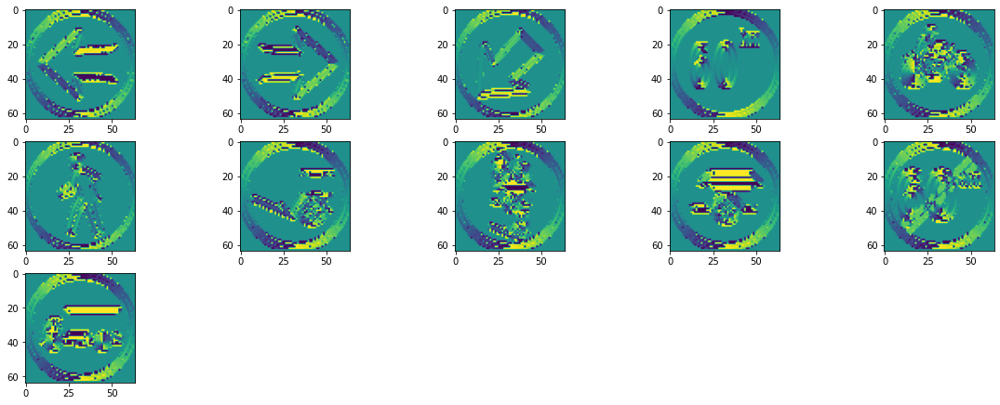

In [ ]:
plt.figure(figsize=(20, 10))
for i in range(11):
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(img_mondatory_direction[i])

#### Regulatory Signs

In [ ]:
n,_,_=img_regulatory_gray.shape
img_regulatory_mag=[]
img_regulatory_direction=[]

for i in range (0,n):
  mag,gradient = img2gradient(img_regulatory_gray[i])
  img_regulatory_mag.append(mag)
  img_regulatory_direction.append(gradient)


img_regulatory_mag=np.array(img_regulatory_mag)
img_regulatory_direction=np.array(img_regulatory_direction)

##### Magnitude Gradient

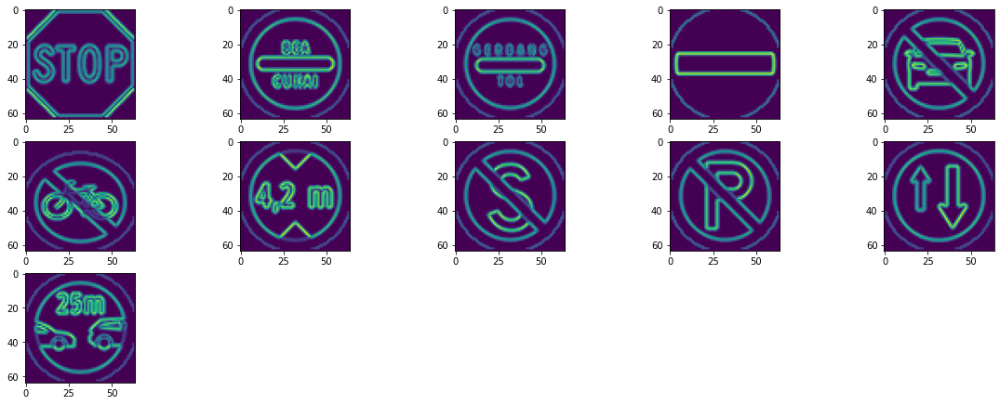

In [ ]:
plt.figure(figsize=(20, 10))
for i in range(11):
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(img_regulatory_mag[i])

##### Direction Gradient

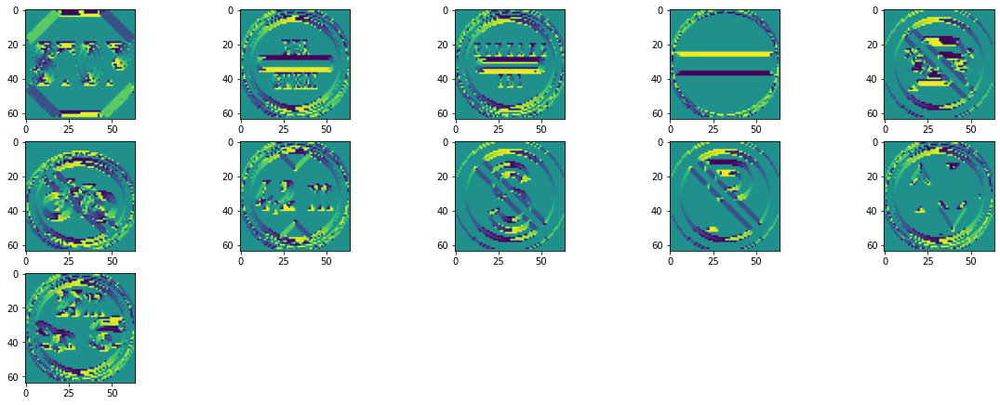

In [ ]:
plt.figure(figsize=(20, 10))
for i in range(11):
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(img_regulatory_direction[i])

#### Warning Signs

In [ ]:
n,_,_=img_warning_gray.shape
img_warning_mag=[]
img_warning_direction=[]

for i in range (0,n):
  mag,gradient = img2gradient(img_warning_gray[i])
  img_warning_mag.append(mag)
  img_warning_direction.append(gradient)


img_warning_mag=np.array(img_warning_mag)
img_warning_direction=np.array(img_warning_direction)

##### Magnitude Gradient

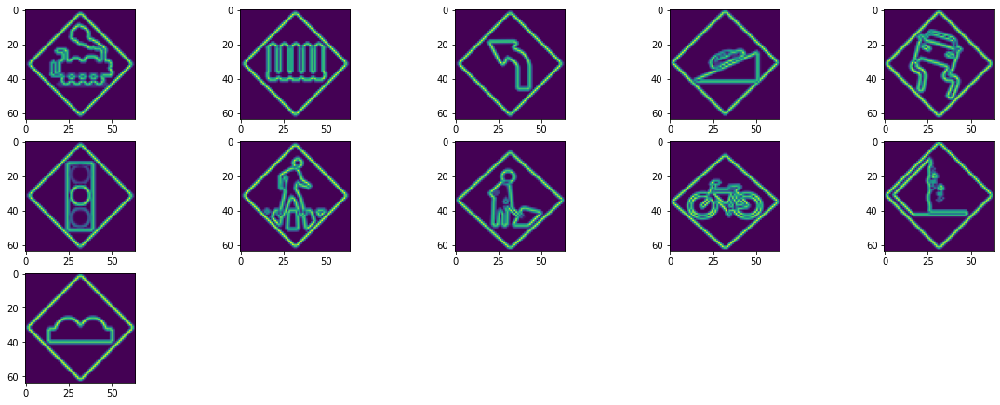

In [ ]:
plt.figure(figsize=(20, 10))
for i in range(11):
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(img_warning_mag[i])

##### Direction Gradient

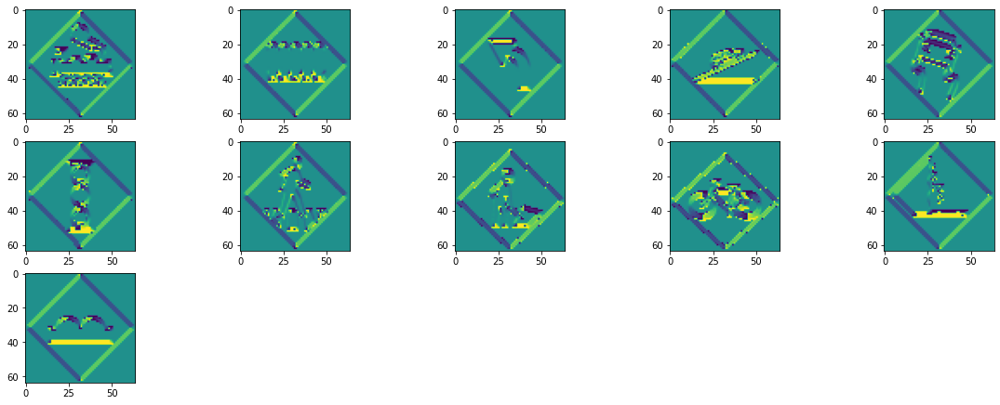

In [ ]:
plt.figure(figsize=(20, 10))
for i in range(11):
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(img_warning_direction[i])

#### Warning Signs

In [ ]:
n,_,_=img_non_gray.shape
img_non_mag=[]
img_non_direction=[]

for i in range (0,n):
  mag,gradient = img2gradient(img_non_gray[i])
  img_non_mag.append(mag)
  img_non_direction.append(gradient)


img_non_mag=np.array(img_non_mag)
img_non_direction=np.array(img_non_direction)

##### Magnitude Gradient

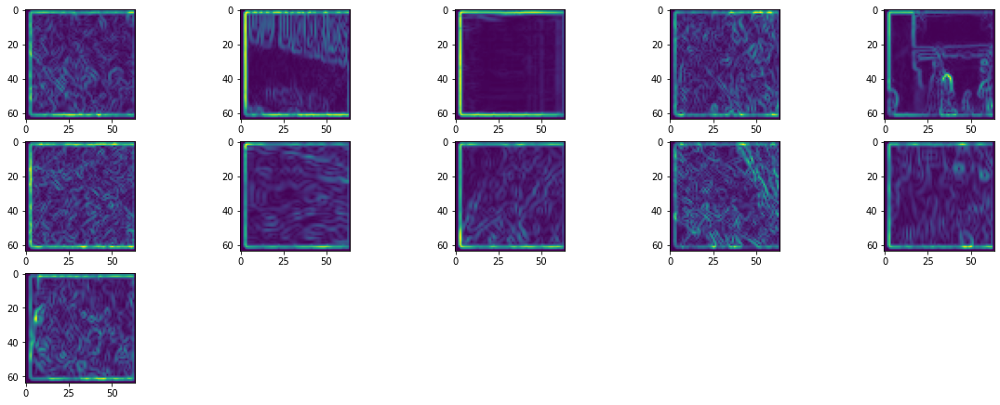

In [ ]:
plt.figure(figsize=(20, 10))
for i in range(11):
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(img_non_mag[i])

##### Direction Gradient

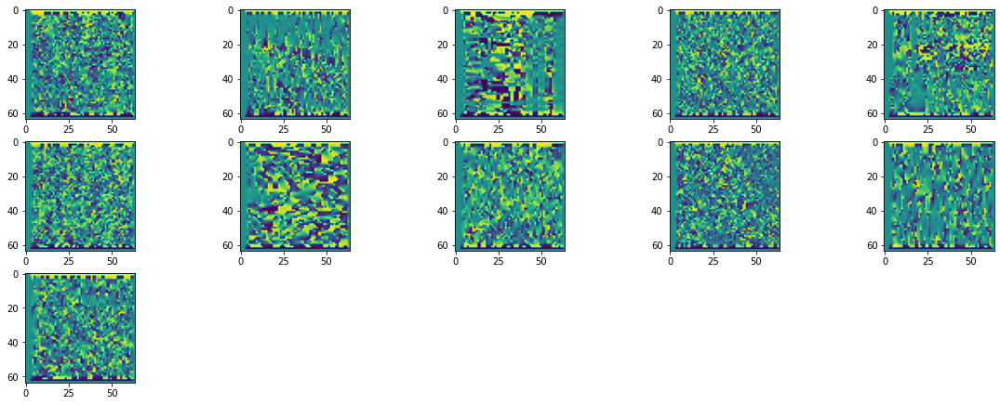

In [ ]:
plt.figure(figsize=(20, 10))
for i in range(11):
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(img_non_direction[i])

 ### Histogram of Gradients in 8×8 cells

In [ ]:
def histogram_gradient(img_data_mag,img_data_direction):
  row,column = img_data_mag.shape
  img_histogram=np.zeros((int(row/8),int(column/8),9))
  for i in range (0,int(row/8)):
    for j in range (0,int(column/8)):
      for y in range(0,9):
        for x in range(0,9):
          direction=img_data_direction[(i*4)+y][(j*4)+x]
          mag=img_data_mag[(i*4)+y][(j*4)+x]
          null_check=isnan(direction)
          if (null_check==False):
            if(direction>=0 and direction<=20):
              low,high=distribution_value(0,20,direction,mag)
              img_histogram[i][j][0]+=low
              img_histogram[i][j][1]+=high
            elif(direction>=20 and direction<=40):
              low,high=distribution_value(20,40,direction,mag)
              img_histogram[i][j][1]+=low
              img_histogram[i][j][2]+=high
            elif(direction>=40 and direction<=60):
              low,high=distribution_value(40,60,direction,mag)
              img_histogram[i][j][2]+=low
              img_histogram[i][j][3]+=high
            elif(direction>=60 and direction<=80):
              low,high=distribution_value(60,80,direction,mag)
              img_histogram[i][j][3]+=low
              img_histogram[i][j][4]+=high
            elif(direction>=80 and direction<=100):
              low,high=distribution_value(80,100,direction,mag)
              img_histogram[i][j][4]+=low
              img_histogram[i][j][5]+=high
            elif(direction>=100 and direction<=120):
              low,high=distribution_value(100,120,direction,mag)
              img_histogram[i][j][5]+=low
              img_histogram[i][j][6]+=high
            elif(direction>=120 and direction<=140):
              low,high=distribution_value(120,140,direction,mag)
              img_histogram[i][j][6]+=low
              img_histogram[i][j][7]+=high
            elif(direction>=140 and direction<=160):
              low,high=distribution_value(140,160,direction,mag)
              img_histogram[i][j][7]+=low
              img_histogram[i][j][8]+=high
            elif(direction>=160 and direction<=180):
              low,high=distribution_value(160,0,direction,mag)
              img_histogram[i][j][0]+=high
              img_histogram[i][j][8]+=low
  return img_histogram

In [ ]:
def distribution_value(low,high,value_direction,value_mag):
  if(low==160 and high==0):
    low_koefisien=180-value_direction/20
    high_koefisien=value_direction-160/20
    low_value=low_koefisien*value_mag
    high_value=high_koefisien*value_mag
    return low_value,high_value
  else:
    low_koefisien=(high-value_direction)/(high-low)
    high_koefisien=(value_direction-low)/(high-low)
    low_value=low_koefisien*value_mag
    high_value=high_koefisien*value_mag
    return low_value,high_value

#### Mondatory Signs

In [ ]:
n,_,_=img_mondatory_mag.shape
img_mondatory_hist=[]
for i in range(0,n):
  temp=histogram_gradient(img_mondatory_mag[i],img_mondatory_direction[i])
  img_mondatory_hist.append(temp)

img_mondatory_hist=np.array(img_mondatory_hist)
print(img_mondatory_hist.shape)

(13, 8, 8, 9)


#### Regulatory Signs

In [ ]:
n,_,_=img_regulatory_mag.shape
img_regulatory_hist=[]
for i in range(0,n):
  temp=histogram_gradient(img_regulatory_mag[i],img_regulatory_direction[i])
  img_regulatory_hist.append(temp)

img_regulatory_hist=np.array(img_regulatory_hist)
print(img_regulatory_hist.shape)

(14, 8, 8, 9)


#### Warning Signs

In [ ]:
n,_,_=img_warning_mag.shape
img_warning_hist=[]
for i in range(0,n):
  temp=histogram_gradient(img_warning_mag[i],img_warning_direction[i])
  img_warning_hist.append(temp)

img_warning_hist=np.array(img_warning_hist)
print(img_warning_hist.shape)

(13, 8, 8, 9)


#### Non Signs

In [ ]:
n,_,_=img_non_mag.shape
img_non_hist=[]
for i in range(0,n):
  temp=histogram_gradient(img_non_mag[i],img_non_direction[i])
  img_non_hist.append(temp)

img_non_hist=np.array(img_non_hist)
print(img_non_hist.shape)

(28, 8, 8, 9)


 ### 16×16 Block Normalization & Calculate the HOG feature vector

In [ ]:
def hog_vector(img_histogram):
  row,column,_=img_histogram.shape
  vector_hog=np.array([])
  x=0
  for i in range(0,row-1):
    for j in range(0,column-1):
      #Normalisasi 16x16 Block
      divide_num=sqrt(np.sum(img_histogram[i][j]**2)+np.sum(img_histogram[i+1][j]**2)+np.sum(img_histogram[i][j+1]**2)+np.sum(img_histogram[i+1][j+1]**2))
      if(divide_num!=0):
        vector_size36=np.array([])
        vector_size36=np.append(vector_size36,[img_histogram[i][j].flatten()/divide_num,img_histogram[i+1][j].flatten()/divide_num,
                                img_histogram[i][j+1].flatten()/divide_num,img_histogram[i+1][j+1].flatten()/divide_num])
      else:
        vector_size36=np.zeros([1,36])
      #Vektor Hog
      vector_hog=np.append(vector_hog,vector_size36)

      x+=1
  return vector_hog


#### Mondatory Signs

In [ ]:
n,_,_,_=img_mondatory_hist.shape
img_mondatory_hogvector=[]
for i in range(0,n):
  temp=hog_vector(img_mondatory_hist[i])
  img_mondatory_hogvector.append(temp)
img_mondatory_hogvector=np.array(img_mondatory_hogvector)
(img_mondatory_hogvector.shape)


(13, 1764)

#### Regulatory Signs

In [ ]:
n,_,_,_=img_regulatory_hist.shape
img_regulatory_hogvector=[]
for i in range(0,n):
  temp=hog_vector(img_regulatory_hist[i])
  img_regulatory_hogvector.append(temp)
img_regulatory_hogvector=np.array(img_regulatory_hogvector)
(img_regulatory_hogvector.shape)


(14, 1764)

#### Warning Signs

In [ ]:
n,_,_,_=img_warning_hist.shape
img_warning_hogvector=[]
for i in range(0,n):
  temp=hog_vector(img_warning_hist[i])
  img_warning_hogvector.append(temp)
img_warning_hogvector=np.array(img_warning_hogvector)
(img_warning_hogvector.shape)


(13, 1764)

#### Non Signs

In [ ]:
n,_,_,_=img_non_hist.shape
img_non_hogvector=[]
for i in range(0,n):
  temp=hog_vector(img_non_hist[i])
  img_non_hogvector.append(temp)
img_non_hogvector=np.array(img_non_hogvector)
(img_non_hogvector.shape)


(28, 1764)

### Simpan Vector HOG ke CSV

In [ ]:
row_list=[]

n,_=img_mondatory_hogvector.shape
for i in range(0,n):
  y=["mondatory","0"]
  x=img_mondatory_hogvector[i].tolist()
  row_list.append(y+x)

n,_=img_regulatory_hogvector.shape
for i in range(0,n):
  y=["regulatory","1"]
  x=img_regulatory_hogvector[i].tolist()
  row_list.append(y+x)

n,_=img_warning_hogvector.shape
for i in range(0,n):
  y=["warning","2"]
  x=img_warning_hogvector[i].tolist()
  row_list.append(y+x)

n,_=img_non_hogvector.shape
for i in range(0,n):
  y=["non","3"]
  x=img_non_hogvector[i].tolist()
  row_list.append(y+x)

print(row_list)


[['mondatory', '0', 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.010389511282400437, 0.30132689497533105, 0.06475234945111694, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2606115826072256, 0.12130352749450693, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.013580717913009232, 0.8601130792380188, 0.286860415077657, 0.0007128638587799453, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.16503570850263877, 0.07681705242585878, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.00860016803675945, 0.5446779072684895, 0.18165812651179375, 0.00045143040390873036, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0020734437523670175, 0.3194337450322322, 0.2971516314875632, 0.04387549245681048, 0.013301415800259855, 0.0, 0.0, 0.0, 0.0, 0.00428652457065855, 0.5638654979127038, 0.35393769841110684, 0.03697096927806087, 0.008353138093592023, 0.0, 0.0, 0.0, 0.0, 0.0019379851502351983, 0.29856505808260964, 0.2777386406231889, 0.04100909549317937, 0.012432430958679085, 0.0, 0.0, 0.0, 0.0, 0.004006484841737886, 0.527028023035258, 0.33081485950419665, 0.03455564655124591, 0.

In [ ]:

with open('quotes.csv', 'w', newline='') as file:
    writer = csv.writer(file, quoting=csv.QUOTE_NONNUMERIC, delimiter='\t')
    writer.writerows(row_list)

# Pembuatan SVM

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn import svm, datasets

## Akses Data Ekstraksi HOG Menggunakan Pandas

In [ ]:
import pandas as pd
dataset = pd.read_csv("quotes.csv",header=None,delimiter='\t') 
dataset.head

<bound method NDFrame.head of          0     1         2         3     ...      1762  1763  1764  1765
0   mondatory     0  0.000000  0.000000  ...  0.000000   0.0   0.0   0.0
1   mondatory     0  0.000000  0.000000  ...  0.001419   0.0   0.0   0.0
2   mondatory     0  0.000000  0.000000  ...  0.000000   0.0   0.0   0.0
3   mondatory     0  0.000000  0.000000  ...  0.000000   0.0   0.0   0.0
4   mondatory     0  0.000000  0.000000  ...  0.088501   0.0   0.0   0.0
..        ...   ...       ...       ...  ...       ...   ...   ...   ...
63        non     3  0.241369  0.079244  ...  0.002375   0.0   0.0   0.0
64        non     3  0.333240  0.190847  ...  0.018727   0.0   0.0   0.0
65        non     3  0.376038  0.084995  ...  0.007316   0.0   0.0   0.0
66        non     3  0.344549  0.109230  ...  0.022911   0.0   0.0   0.0
67        non     3  0.492422  0.064821  ...  0.004351   0.0   0.0   0.0

[68 rows x 1766 columns]>

## Melakukan Pencarian Hyperline Berdasarkan Train Set

In [ ]:
y=dataset.iloc[:,1]
X=dataset.iloc[:,2:]
sc_X = StandardScaler()
X = sc_X.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state = 0)

linear = svm.SVC(kernel='linear', C=1, decision_function_shape='ovo').fit(X_train, y_train)

## Perhitungan Performa SVM

In [ ]:
y_pred = linear.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       1.00      1.00      1.00         2
           2       1.00      1.00      1.00         5
           3       1.00      1.00      1.00        12

    accuracy                           1.00        21
   macro avg       1.00      1.00      1.00        21
weighted avg       1.00      1.00      1.00        21



In [ ]:
def predict_img(img_data, sc_X):
  img_data_resize=img_data.resize((64,64))
  img_data_resize=np.array(img_data_resize)
  img_gray=rgb_grayscale(img_data_resize)
  img_mag,img_direction=img2gradient(img_gray)
  img_hist=histogram_gradient(img_mag,img_direction)
  img_hog=hog_vector(img_hist)
  vector_hog=sc_X.transform([img_hog])
  predict=linear.predict(vector_hog)
  label=["Mondatory Signs", "Regulatory Signs", "Warning Signs","Non Traffic Sign"]
  # plt.title("Prediction : "+ label[int(predict)])
  # plt.imshow(img_data_resize)
  return label[int(predict)]

In [ ]:
image = Image.open("/content/crop.jpg",'r')
#/content/drive/MyDrive/dataset_traffic/Mondatory Signs/120px-Indonesia_New_Road_Sign_Mndtry_1a.png
#/content/drive/MyDrive/dataset_traffic/Warning Signs/110px-Indonesia_New_Road_Sign_8b.png
predict_img(image,sc_X)

'Regulatory Signs'

In [ ]:

i=0
for dir in warning_dir:  
  plt.figure(i)
  image = Image.open("/content/drive/MyDrive/dataset_traffic/Warning Signs/"+dir,'r')
  predict_img(image,sc_X)
  i+=1

<Figure size 1152x648 with 0 Axes>

<Figure size 1152x648 with 0 Axes>

<Figure size 1152x648 with 0 Axes>

<Figure size 1152x648 with 0 Axes>

<Figure size 1152x648 with 0 Axes>

<Figure size 1152x648 with 0 Axes>

<Figure size 1152x648 with 0 Axes>

<Figure size 1152x648 with 0 Axes>

<Figure size 1152x648 with 0 Axes>

<Figure size 1152x648 with 0 Axes>

<Figure size 1152x648 with 0 Axes>

<Figure size 1152x648 with 0 Axes>

<Figure size 1152x648 with 0 Axes>

In [ ]:
def region_segmentation(img_seg,img_rgb,pixel_size,sc_X):
    #Melabeli Region-region yang terhubung
    rule=np.array([[0,0]])
    label=0
    row=img_seg.shape[0]
    column=img_seg.shape[1]
    img_zeros=np.zeros((row,column))
    for i in range(1,row):
        for j in range(1,column):
            if(img_seg[i][j]==1):
                atas=img_zeros[i-1][j]
                kiri=img_zeros[i][j-1]
                if(kiri==0 and atas==0):
                    label=label+1
                    img_zeros[i][j]=label
                elif(kiri==0 and atas!=0):
                    img_zeros[i][j]=atas
                elif(kiri!=0 and atas==0):
                    img_zeros[i][j]=kiri
                elif(kiri!=0 and atas!=0 and kiri==atas):
                    img_zeros[i][j]=kiri
                elif(kiri!=0 and atas!=0 and kiri!=atas):
                    if(kiri<atas):
                        img_zeros=np.where(img_zeros==atas, kiri, img_zeros) 
                    elif(kiri>atas):
                        img_zeros=np.where(img_zeros==kiri, atas, img_zeros) 
            else:
                img_zeros[i][j]=0

    #Membatasi nilai region yang terdeteksi
    data_label=[]
    for i in range(0,int(np.max(img_zeros))):
      j=img_zeros[img_zeros==i].shape
      if(j[0]>pixel_size):
          data_label.append(i)

    # Cropping Image Hasil Region Segmentasi ke 64 x 64
    img_reg_seg=[]
    # plt.figure(99)
    # plt.figure(figsize=(20, 10))

    j=0
    for i in data_label:
      if(i!=0):
          itemindex=np.where(img_zeros==i)
          min_row=np.min(itemindex[0])
          max_row=np.max(itemindex[0])
          min_column=np.min(itemindex[1])
          max_column=np.max(itemindex[1])
          plt.figure(i+2)
          img=Image.fromarray(img_rgb)
          crop_size = (min_column, min_row,max_column,max_row)
          imgcrop=img.crop(crop_size)
          imgcrop=imgcrop.resize((64,64))
          
          # plt.imshow(imgcrop)
          ax = plt.subplot(4, 5, j + 1)

          plt.title(predict_img(imgcrop, sc_X)) #Prediksi label dengan menggunakan HOG dan SVM
          plt.imshow(imgcrop)
          j+=1

          

          
    

    return data_label



In [ ]:
def segmentasi_warna(img):
  row,column,_ = img.shape
  img_seg=np.zeros((row,column))
  for i in range (0,row):
    for j in range(0,column):
      if(color_pixel(img[i][j])==True):
        img_seg[i][j]=1
  return img_seg

In [ ]:
def color_pixel(pixel):
  red_rl=80
  red_rh=255
  red_gl=0
  red_gh=80
  red_bl=0
  red_bh=80

  blue_rl=0
  blue_rh=80
  blue_gl=0
  blue_gh=80
  blue_bl=100
  blue_bh=255

  yellow_rl=100
  yellow_rh=255
  yellow_gl=100
  yellow_gh=255
  yellow_bl=0
  yellow_bh=120

  if(pixel[0]>=yellow_rl and pixel[0]<=yellow_rh and pixel[1]>=yellow_gl and pixel[1]<=yellow_gh and pixel[2]>=yellow_bl) and pixel[2]<=yellow_bh:
    return True
  elif(pixel[0]>=blue_rl and pixel[0]<=blue_rh and pixel[1]>=blue_gl and pixel[1]<=blue_gh and pixel[2]>=blue_bl) and pixel[2]<=blue_bh:
    return True
  elif(pixel[0]>=red_rl and pixel[0]<=red_rh and pixel[1]>=red_gl and pixel[1]<=red_gh and pixel[2]>=red_bl) and pixel[2]<=red_bh:
    return True
  
  else:
    return False

# image = Image.open("/content/test4.jpg",'r')
# image.resize((150,150))
# image=np.array(image)
# plt.figure(1)
# plt.imshow(image)
# x=segmentasi_warna(image)
# plt.imshow(x,cmap="gray")

# image = Image.open("/content/test7.jpg",'r')
# image.resize((150,150))
# image=np.array(image)
# plt.figure(2)
# plt.imshow(image)
# x=segmentasi_warna(image)
# plt.imshow(x,cmap="gray")


# plt.figure(3)

In [ ]:
def deteksi_img(img,sc_X,pixel_area):
  img_temp=np.copy(img)
  img_seg=segmentasi_warna(img_temp)
  
  plt.figure(1)
  plt.rcParams["figure.figsize"] = [16,9]
  fig, (ax1, ax2) = plt.subplots(1, 2)
  ax1.imshow(img)
  ax1.set_title("Sebelum Segmentasi RGB")
  ax2.imshow(img_seg,cmap="gray")
  ax2.set_title("Setelah Segmentasi RGB")
  x=region_segmentation(img_seg,img_temp,pixel_area,sc_X)
  print(x)

## Pengujian 

[0, 58, 245]


<Figure size 1152x648 with 0 Axes>

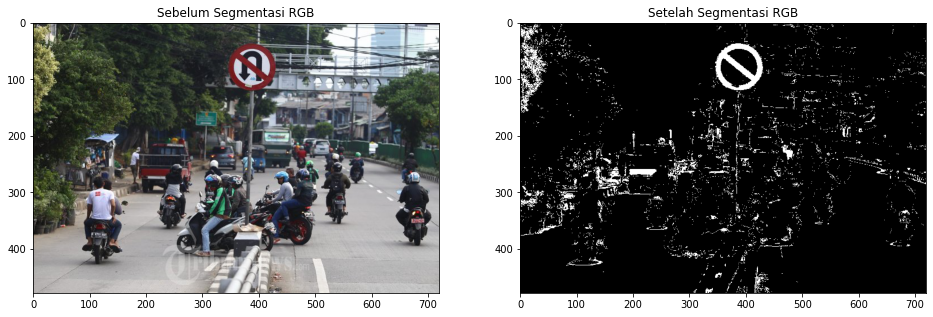

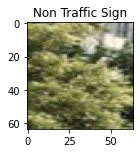

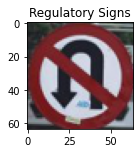

In [ ]:
image = Image.open("/content/test1.jpg",'r')
image=np.array(image)
deteksi_img(image,sc_X,pixel_area=500)

[0, 11, 28, 1225, 1813, 2138, 2418, 2984]


<Figure size 1152x648 with 0 Axes>

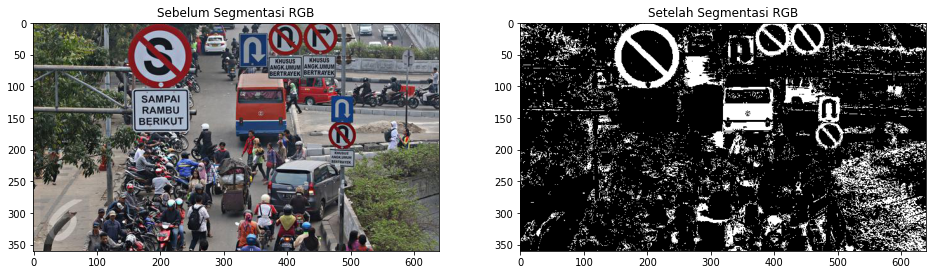

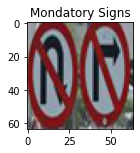

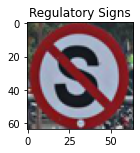

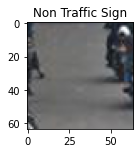

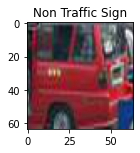

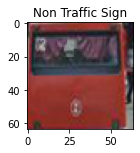

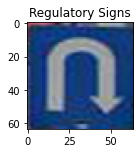

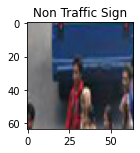

In [ ]:
image = Image.open("/content/test2.jpg",'r')
image=np.array(image)
deteksi_img(image,sc_X,pixel_area=800)

[0, 6, 3349, 4030, 4850, 5512, 5919, 6070]


<Figure size 1152x648 with 0 Axes>

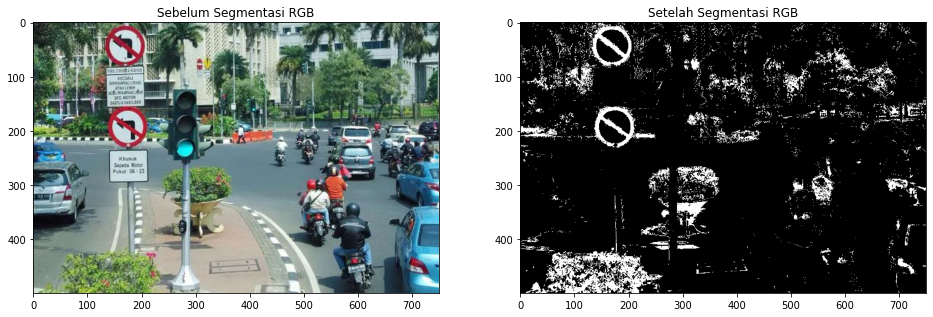

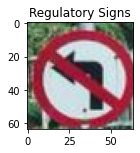

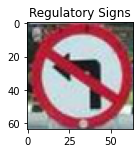

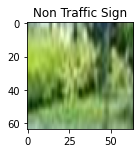

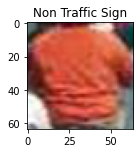

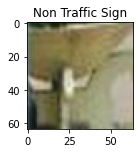

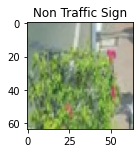

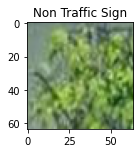

In [ ]:
image = Image.open("/content/test3.jpg",'r')
image=np.array(image)
deteksi_img(image,sc_X,pixel_area=500)

[0, 2, 1778, 1994]


<Figure size 1152x648 with 0 Axes>

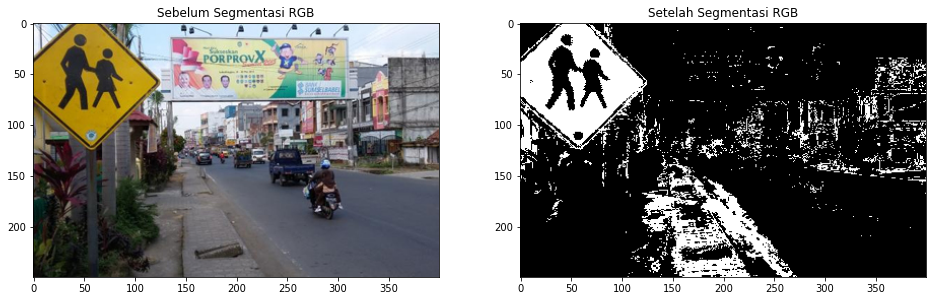

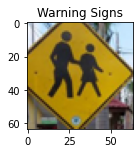

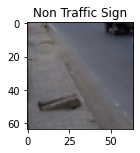

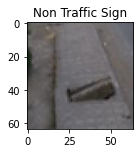

In [ ]:
image = Image.open("/content/test4.jpg",'r')
image=np.array(image)
deteksi_img(image,sc_X,pixel_area=500)

[0, 239, 1770, 1790, 2608, 2940]


<Figure size 1152x648 with 0 Axes>

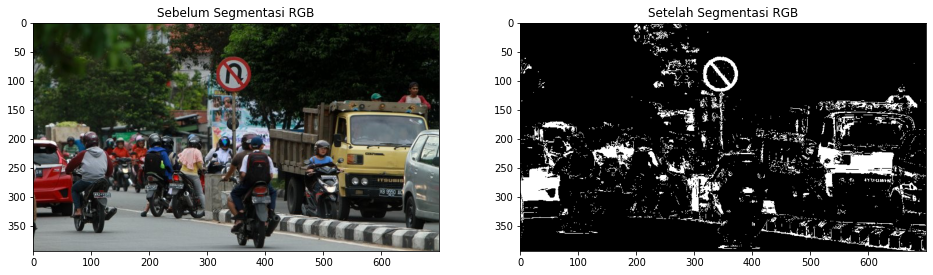

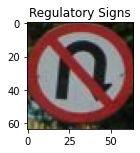

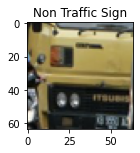

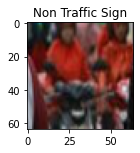

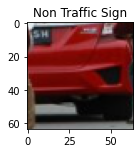

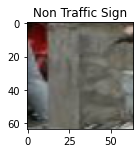

In [ ]:
image = Image.open("/content/test5.jpg",'r')
image=np.array(image)
deteksi_img(image,sc_X,pixel_area=500)

[0, 418, 1683, 1737, 5592, 8935, 19004, 19918]


<Figure size 1152x648 with 0 Axes>

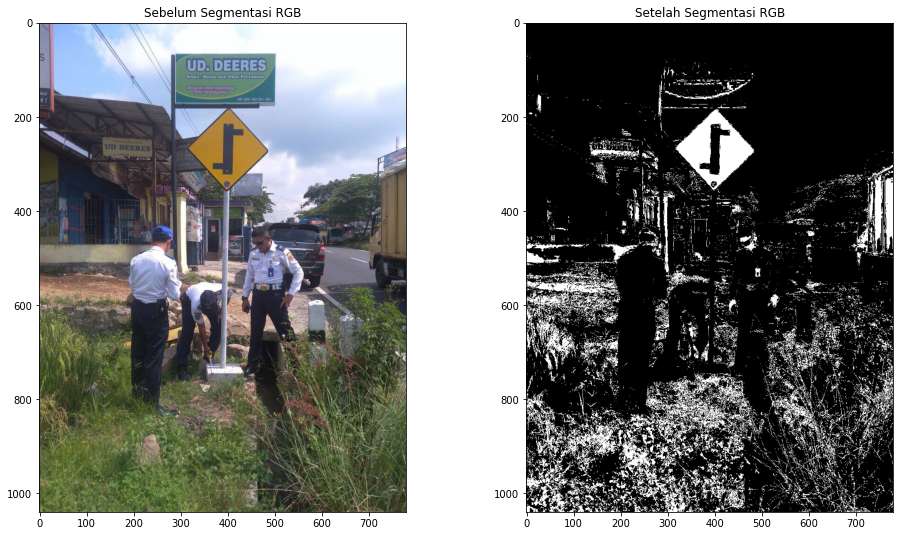

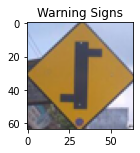

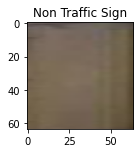

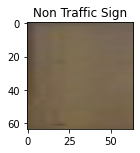

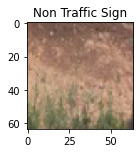

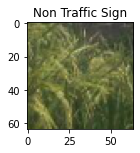

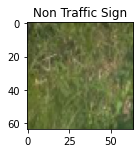

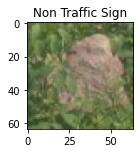

In [ ]:
image = Image.open("/content/test6.jpg",'r')
image=np.array(image)
deteksi_img(image,sc_X,pixel_area=1500)

[0, 41, 2991, 4341, 7448, 8606, 9170, 9275]


<Figure size 1152x648 with 0 Axes>

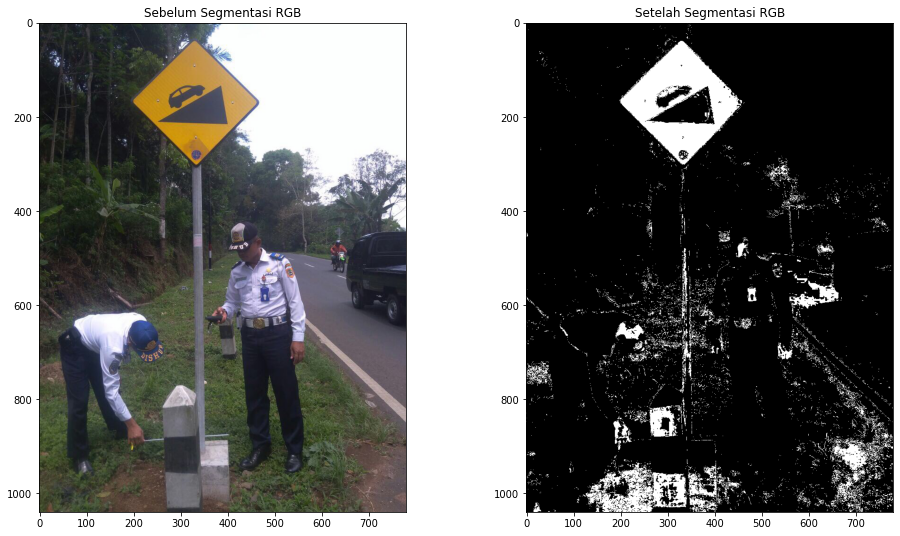

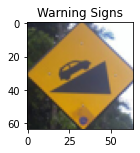

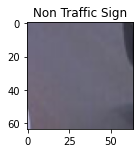

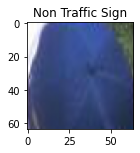

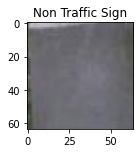

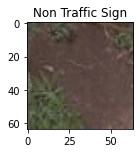

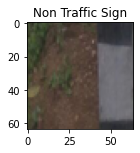

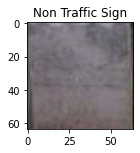

In [ ]:
image = Image.open("/content/test7.jpg",'r')
image=np.array(image)
deteksi_img(image,sc_X,pixel_area=500)

[0, 1, 1589, 2064, 2684, 5499, 6070, 6265, 8134, 8773, 10398, 10623, 11274, 12411, 13700, 15225, 15238, 15424, 15904, 18654]


<Figure size 1152x648 with 0 Axes>

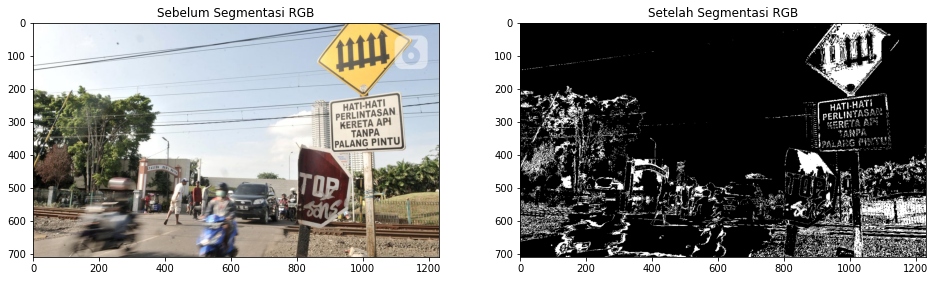

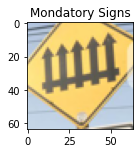

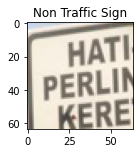

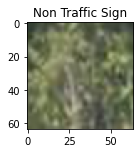

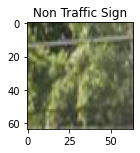

...

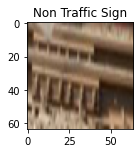

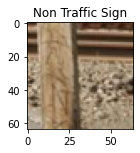

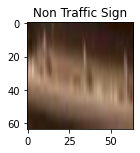

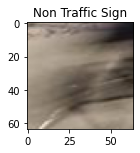

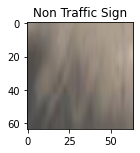

In [ ]:
image = Image.open("/content/test8.jpg",'r')
image=np.array(image)
deteksi_img(image,sc_X,pixel_area=500)

[0, 258, 2836, 4661]


<Figure size 1152x648 with 0 Axes>

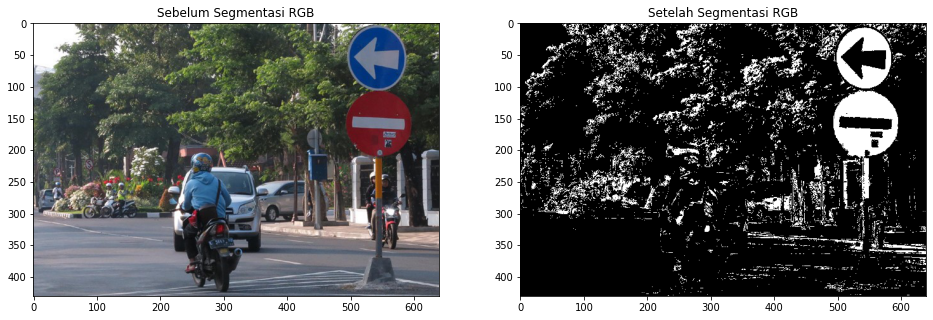

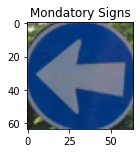

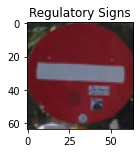

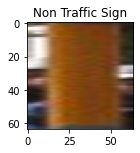

In [ ]:
image = Image.open("/content/test9.jpeg",'r')
image=np.array(image)
deteksi_img(image,sc_X,pixel_area=500)

[0, 730, 6482, 6686, 6816, 7343, 7432, 7559, 8290, 8568]


<Figure size 1152x648 with 0 Axes>

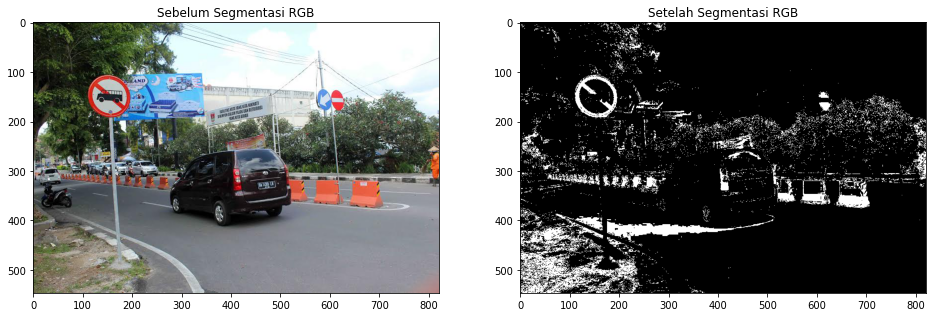

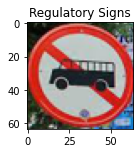

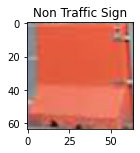

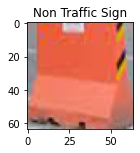

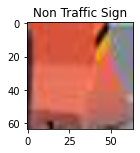

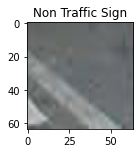

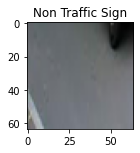

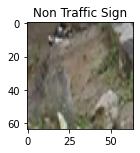

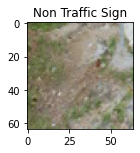

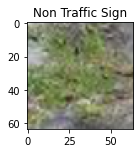

In [ ]:
image = Image.open("/content/test10.jpg",'r')
image=np.array(image)
deteksi_img(image,sc_X,pixel_area=500)

[0, 41, 481, 629, 2719, 2809, 3035, 3092]


<Figure size 1152x648 with 0 Axes>

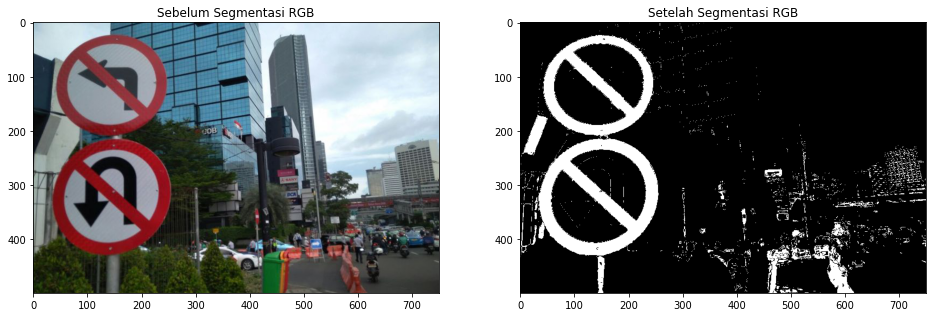

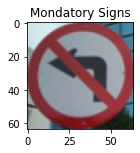

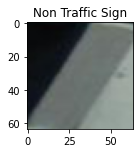

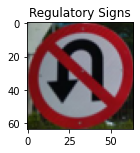

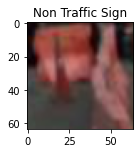

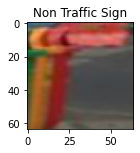

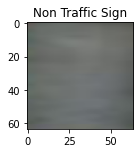

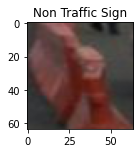

In [ ]:
image = Image.open("/content/test11.jpg",'r')
image=np.array(image)
deteksi_img(image,sc_X,pixel_area=500)

[0, 576, 2873]


<Figure size 1152x648 with 0 Axes>

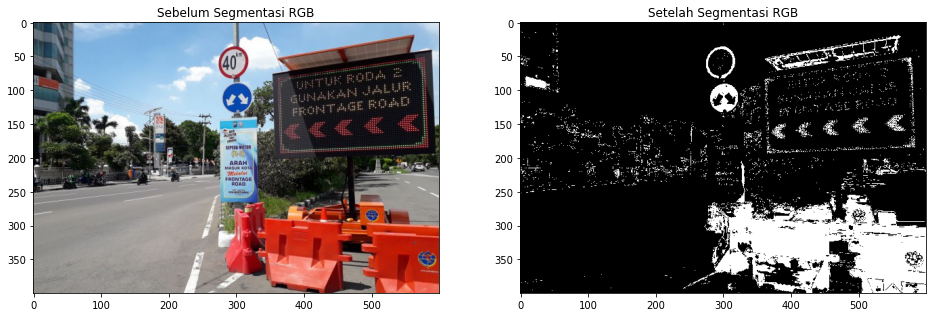

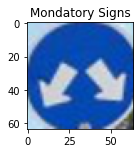

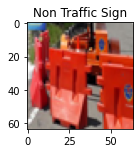

In [ ]:
image = Image.open("/content/test12.jpg",'r')
image=np.array(image)
deteksi_img(image,sc_X,pixel_area=500)

[0, 166, 3668, 4105, 4530, 4691, 4968, 5658, 5711, 6222, 6424, 6712]


<Figure size 1152x648 with 0 Axes>

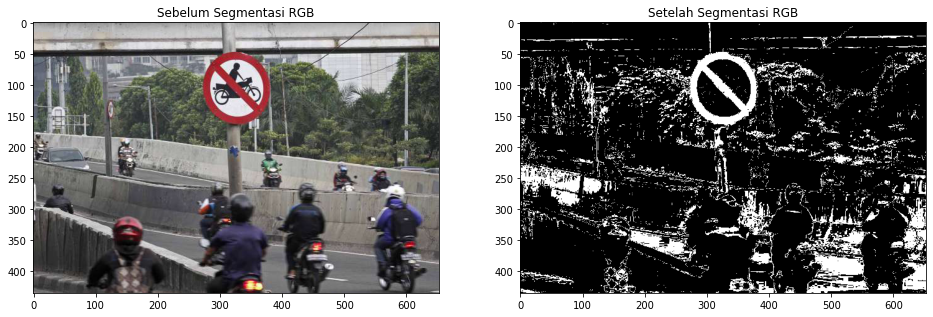

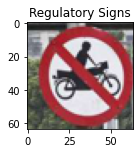

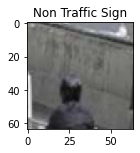

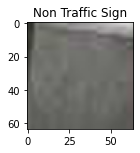

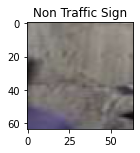

...

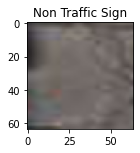

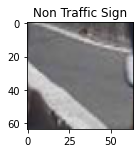

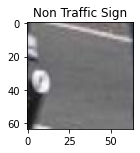

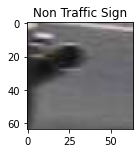

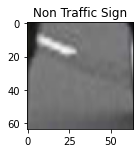

In [ ]:
image = Image.open("/content/test13.jpg",'r')
image=np.array(image)
deteksi_img(image,sc_X,pixel_area=500)